In [1]:
import gym
# Register the environment with Gym
gym.envs.register(
    id='DroneGrid-v0',
    entry_point='drone100:DroneGridEnv',
)

In [2]:
import gym

# Create an instance of the DroneGridEnv environment
env = gym.make('DroneGrid-v0')

In [3]:
import numpy as np
import gym
import random
from IPython.display import clear_output
import time 

In [4]:
# Initialize Q-table with zeros
num_states = np.prod(env.observation_space.n)  # Get the total number of states
num_actions = env.action_space.n
q_table = np.zeros((100, 4)) #np.zeros((16, 4))
print(q_table)
print(num_states)


[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0.

In [5]:
rewards_all_episodes = []

In [6]:
total_episodes = 10000        # Total episodes
learning_rate = 0.1           # Learning rate
max_steps = 150                # Max steps per episode
gamma = 0.99                  # Discounting rate

# Exploration parameters
epsilon = 1.0                 # Exploration rate
max_epsilon = 1.0             # Exploration probability at start
min_epsilon = 0.1            # Minimum exploration probability 
discount_rate = 0.01  #0.01         # Exponential decay rate for exploration prob


In [7]:
# List of rewards
rewards = []
steps = []
# 2 For life or until learning is stopped
for episode in range(total_episodes):
    # Reset the environment
    state = env.reset()
    step = 0
    done = False
    total_rewards = 0
    print("****************new episode**********************")
    for step in range(max_steps):
        # 3. Choose an action a in the current world state (s)
        ## First we randomize a number
        exp_exp_tradeoff = random.uniform(0, 1)
        
        ## If this number > greater than epsilon --> exploitation (taking the biggest Q value for this state)
        if exp_exp_tradeoff > epsilon:
            action = np.argmax(q_table[state,:])

        # Else doing a random choice --> exploration
        else:
            action = env.action_space.sample()

        # Take the action (a) and observe the outcome state(s') and reward (r)
        new_state, reward, done, info = env.step(action)
        print(action)

        # Update Q(s,a):= Q(s,a) + lr [R(s,a) + gamma * max Q(s',a') - Q(s,a)]
        # qtable[new_state,:] : all the actions we can take from new state
        q_table[state, action] = q_table[state, action] * (1 - learning_rate) + \
        learning_rate * (reward + discount_rate * np.max(q_table[new_state, :]))
        total_rewards += reward
        
        # Our new state is state
        state = new_state
        print("step ", step, "     ", "new_state", new_state)
        # If done (if we're done), finish episode
        if done == True: 
            steps.append(step) # Move this line inside the inner loop
            print("Number of steps", step)
            print("Final state:", new_state)
            rewards.append(total_rewards) # Move this line inside the inner loop
            print("total_rewards:   ", total_rewards, "Score over time: "+str(sum(rewards)))           
            break
        
    # Reduce epsilon (because we need less and less exploration)
    epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-discount_rate * episode) 

print("Score over time: " + str(sum(rewards) / total_episodes))
print(q_table)


C:\Users\Dell\anaconda3\envs\tensorflow\lib\site-packages\gym\utils\passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
C:\Users\Dell\anaconda3\envs\tensorflow\lib\site-packages\gym\utils\passive_env_checker.py:187: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed `options` to allow the environment initialisation to be passed additional information.
  logger.warn(
C:\Users\Dell\anaconda3\envs\tensorflow\lib\site-packages\gym\utils\passive_env_checker.py:195: UserWarning: WARN: The result returned by `env.reset()` was not a tuple of the form `(obs, info)`, where `obs` is a observation and `info` is a dictionary containing additional information. Actual type: `<class 'int'>`
  logger.warn(
C:\Users\Dell\anaconda3\envs\tensorflow\lib\site-packages\gym\utils\passive_env_checker.py:219: Depreca

****************new episode**********************
0
step  0       new_state 1
1
step  1       new_state 0
3
step  2       new_state 10
0
step  3       new_state 11
2
step  4       new_state 1
3
step  5       new_state 11
3
step  6       new_state 21
0
step  7       new_state 22
1
step  8       new_state 21
3
step  9       new_state 31
1
step  10       new_state 30
3
step  11       new_state 40
Number of steps 11
Final state: 40
total_rewards:    -1 Score over time: -1
****************new episode**********************
1
step  0       new_state 0
3
step  1       new_state 10
0
step  2       new_state 11
1
step  3       new_state 10
2
step  4       new_state 0
0
step  5       new_state 1
0
step  6       new_state 2
2
step  7       new_state 2
2
step  8       new_state 2
0
step  9       new_state 3
2
step  10       new_state 3
0
step  11       new_state 4
1
step  12       new_state 3
0
step  13       new_state 4
3
step  14       new_state 14
3
step  15       new_state 24
Number of steps 15

In [8]:
print(q_table.max())
print(steps)
print(rewards)


1.999999999999999
[11, 15, 19, 21, 20, 42, 13, 12, 10, 38, 10, 46, 32, 20, 19, 20, 9, 39, 13, 23, 10, 25, 24, 5, 15, 23, 29, 6, 35, 28, 22, 9, 12, 7, 11, 21, 38, 19, 5, 11, 15, 19, 15, 9, 6, 13, 27, 8, 20, 15, 40, 19, 14, 13, 14, 10, 10, 22, 14, 7, 69, 34, 23, 15, 15, 19, 5, 35, 17, 6, 9, 15, 57, 8, 28, 8, 31, 9, 11, 8, 47, 15, 8, 11, 13, 10, 19, 13, 14, 20, 8, 27, 51, 13, 73, 8, 14, 43, 18, 11, 47, 21, 17, 18, 10, 4, 33, 11, 17, 15, 11, 15, 27, 17, 14, 24, 16, 45, 26, 9, 13, 4, 17, 6, 23, 27, 26, 7, 9, 44, 20, 20, 11, 46, 11, 35, 6, 73, 67, 11, 12, 25, 11, 34, 38, 6, 11, 14, 12, 9, 13, 12, 6, 22, 39, 21, 45, 25, 13, 14, 55, 9, 17, 20, 17, 7, 19, 30, 25, 13, 18, 8, 22, 32, 15, 18, 37, 7, 15, 6, 8, 19, 11, 68, 30, 11, 16, 16, 7, 10, 46, 42, 118, 17, 31, 8, 9, 7, 18, 28, 15, 56, 63, 106, 20, 6, 14, 10, 9, 9, 11, 18, 26, 28, 12, 27, 18, 10, 18, 13, 56, 60, 15, 12, 17, 37, 14, 6, 14, 10, 16, 6, 17, 25, 19, 12, 89, 22, 85, 72, 116, 32, 12, 97, 25, 9, 6, 10, 45, 32, 18, 10, 7, 19, 73, 14, 13

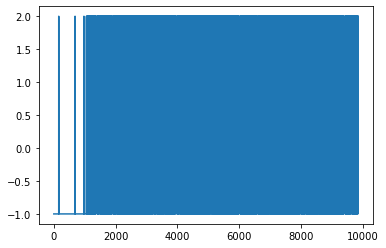

In [13]:
from matplotlib import pyplot as plt
plt.plot(rewards)
plt.show()

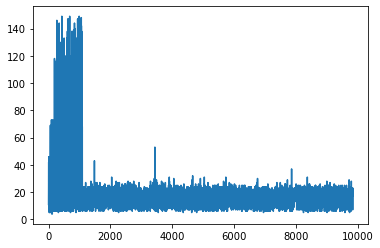

In [10]:

plt.plot(steps)
plt.show()

In [11]:
#import random
total_rewards = []
total_steps = []

for episode in range(100):
    state = env.reset()
    step=0;
    done = False
    episode_reward = 0
    while not done:
        action = np.argmax(q_table[state, :])
        state, reward, done, info = env.step(action)
        episode_reward += reward
        step+=1
    #print("episode: ", episode, "episode_reward: ", episode_reward)
    total_rewards.append(episode_reward)
    total_steps.append(step)
    
avg_reward = sum(total_rewards) / 100
print("Average reward per episode:", avg_reward)


avg_steps = sum(total_steps) / 100
print("Average steps per episode:", avg_steps)
env.close()


Average reward per episode: 2.0
Average steps per episode: 18.0
